## DM DRP Analysis Sprint, Feb. 2020

### Q: What do the subtracted backgrounds look like in gri?

#### V1: Tract 9697

In particular, this is referring to the backgrounds that have been subtracted from deepCoadds (known as deepCoadd_calexp_background).

To check this, make images of the backgrounds, which were created via spline interpolation of 128x128 regions.

In [2]:
import lsst.daf.persistence as dafPersist
import lsst.geom as geom
import lsst.afw.image as afwImage
import lsst.pipe.base as pipeBase

In [3]:
import os
import glob
import numpy as np
import pandas as pd
import random
from scipy import mgrid
from skimage.filters import gaussian

# img_scale is a local package (copy from /jhome/jcarlin/DM_sprint_Feb2020/img_scale.py):
import img_scale

from astropy.visualization import (MinMaxInterval, AsinhStretch, ZScaleInterval, LogStretch, LinearStretch,
                                   ImageNormalize)

In [4]:
# Set some plotting defaults
%matplotlib inline
import matplotlib.pyplot as plt
zscale = ZScaleInterval()

plt.rcParams.update({'figure.figsize' : (12, 8)})
plt.rcParams.update({'font.size' : 12})
plt.rcParams.update({'axes.linewidth' : 3})
plt.rcParams.update({'axes.labelweight' : 3})
plt.rcParams.update({'axes.titleweight' : 3})
plt.rcParams.update({'ytick.major.width' : 3})
plt.rcParams.update({'ytick.minor.width' : 2})
plt.rcParams.update({'ytick.major.size' : 8})
plt.rcParams.update({'ytick.minor.size' : 5})
plt.rcParams.update({'xtick.major.size' : 8})
plt.rcParams.update({'xtick.minor.size' : 5})
plt.rcParams.update({'xtick.major.width' : 3})
plt.rcParams.update({'xtick.minor.width' : 2})
plt.rcParams.update({'xtick.direction' : 'in'})
plt.rcParams.update({'ytick.direction' : 'in'})

In [5]:
# The output repo is tagged with the Jira ticket number "DM-22223":
rc2_repo = '/datasets/hsc/repo/rerun/RC/w_2020_03/DM-23121'

In [6]:
# Initialize the butler repo:
butler = dafPersist.Butler(rc2_repo)

# Make a glob of the files in the repo, so we can parse this to get tract/patch IDs:
infiles = glob.glob(rc2_repo+'/deepCoadd-results/HSC-*/9697/*/calexp-*.fits') # for tract/patch/filter
print(len(infiles))

405


#### Make arrays of the tract, patch numbers by parsing the filenames

In [7]:
tract_array = []
patch_array = []
#visit_array = []
filter_array = []

# Each line of "infiles" looks like this (infile[0]):
##### '/datasets/hsc/repo/rerun/RC/w_2019_46/DM-22223/deepCoadd/HSC-R/9615/8,8/warp-HSC-R-9615-8,8-23902.fits'
# '/datasets/hsc/repo/rerun/RC/w_2020_03/DM-23121/deepCoadd-results/HSC-G/9697/3,2/calexp-HSC-G-9697-3,2.fits'

# Split on the '/', then parse the resulting array. Here's the result of infiles[0].split('/'):

#['',
# 'datasets',
# 'hsc',
# 'repo',
# 'rerun',
# 'RC',
# 'w_2019_46',
# 'DM-22223',
# 'deepCoadd',
# 'HSC-R',
# '9615',
# '8,8',
# 'warp-HSC-R-9615-8,8-23902.fits']

# So the tract number is third from the end, and patch is second from the end.

for ii in range(0, len(infiles)):
    parts = infiles[ii].split('/')
    tract_array.append(int(parts[-3]))
    patch_array.append(parts[-2])
    filter_array.append(parts[-4])

print('Found %i patches'%(len(patch_array)))
        
# Assemble in pandas data frame    
data = {'tract': tract_array,
        'patch': patch_array,
#        'visit': visit_array,
        'filt': filter_array}
df_tract_patch_visit = pd.DataFrame(data=data)

Found 405 patches


Work with tract 9697, which has significant Galactic cirrus.

In [8]:
#df_tract9697 = df_tract_patch_visit.loc[df_tract_patch_visit['tract'] == 9697]

# Patch 2,3 has lots of cirrus:
df_tract9697 = df_tract_patch_visit.loc[(df_tract_patch_visit['tract'] == 9697) & (df_tract_patch_visit['patch'] == '2,3')]

In [9]:
np.size(df_tract9697)

15

In [10]:
df_tract9697

,tract,patch,filt
48,9697,"2,3",HSC-Y
129,9697,"2,3",HSC-R
210,9697,"2,3",HSC-Z
291,9697,"2,3",HSC-I
372,9697,"2,3",HSC-G


In [11]:
### Randomly select a tract/patch in g-band filter:
df_g = df_tract9697.loc[df_tract9697['filt'] == 'HSC-G'].sample(n=1)
df_r = df_tract9697[(df_tract9697['filt'] == 'HSC-R') & (df_tract9697['tract'] == int(df_g.tract.values[0])) & (df_tract9697['patch'] == str(df_g.patch.values[0]))]
df_i = df_tract9697[(df_tract9697['filt'] == 'HSC-I') & (df_tract9697['tract'] == int(df_g.tract.values[0])) & (df_tract9697['patch'] == str(df_g.patch.values[0]))]

In [12]:
dataref_g = {'tract':int(df_g.tract.values[0]), 'patch':df_g.patch.values[0], 'filter':df_g.filt.values[0]}
bg_img_g = butler.get('deepCoadd_calexp_background', dataId = dataref_g).getImage().array
#img_g = butler.get('deepCoadd_calexp', dataId = dataref_g).getImage().array
img_g = butler.get('deepCoadd', dataId = dataref_g).getImage().array
dataref_r = {'tract':int(df_r.tract.values[0]), 'patch':df_r.patch.values[0], 'filter':df_r.filt.values[0]}
bg_img_r = butler.get('deepCoadd_calexp_background', dataId = dataref_r).getImage().array
img_r = butler.get('deepCoadd', dataId = dataref_r).getImage().array
#img_r = butler.get('deepCoadd_calexp', dataId = dataref_r).getImage().array
dataref_i = {'tract':int(df_i.tract.values[0]), 'patch':df_i.patch.values[0], 'filter':df_i.filt.values[0]}
bg_img_i = butler.get('deepCoadd_calexp_background', dataId = dataref_i).getImage().array
img_i = butler.get('deepCoadd', dataId = dataref_i).getImage().array
calexp_i = butler.get('deepCoadd', dataId = dataref_i)

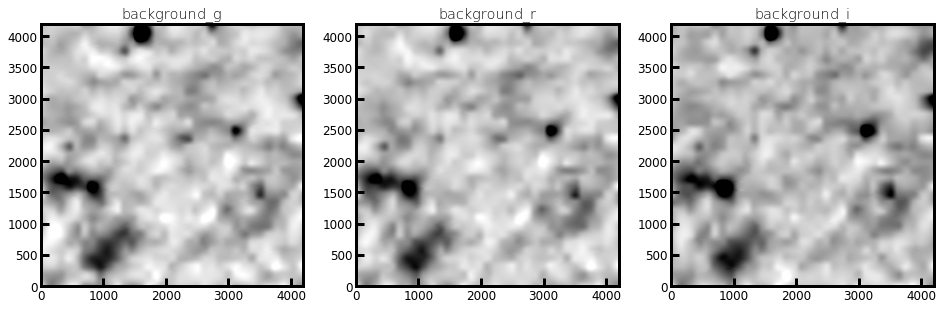

In [13]:
# Set up some plotting defaults:
plt.rcParams.update({'figure.figsize' : (16, 12)})
plt.rcParams.update({'font.size' : 12})

f, ax = plt.subplots(1, 3)
axs = ax.flatten()

# Create an ImageNormalize object
norm_g = ImageNormalize(bg_img_g, interval=ZScaleInterval(),
                        stretch=LinearStretch())
norm_r = ImageNormalize(bg_img_r, interval=ZScaleInterval(),
                        stretch=LinearStretch())
norm_i = ImageNormalize(bg_img_i, interval=ZScaleInterval(),
                        stretch=LinearStretch())

im0 = axs[0].imshow(bg_img_g, norm=norm_g, origin='lower', cmap='binary')
axs[0].set_title('background_g')
im1 = axs[1].imshow(bg_img_r, norm=norm_r, origin='lower', cmap='binary')
axs[1].set_title('background_r')
im2 = axs[2].imshow(bg_img_i, norm=norm_i, origin='lower', cmap='binary')
axs[2].set_title('background_i')

plt.show()

In [14]:
# Function to create an RGB image from input images in three bands
def rgb_img(im_g, im_r, im_i):
    im_gri = np.zeros((im_i.shape[0], im_i.shape[1], 3), dtype=float)
    iscale = img_scale.range_from_zscale(im_i)
    gscale = img_scale.range_from_zscale(im_g)
    rscale = img_scale.range_from_zscale(im_r)
    im_gri[:,:,0] = img_scale.linear(im_i, scale_min=iscale[0], scale_max=3.0*iscale[1])
    im_gri[:,:,1] = img_scale.linear(im_r, scale_min=rscale[0], scale_max=3.0*rscale[1])
    im_gri[:,:,2] = img_scale.linear(im_g, scale_min=gscale[0], scale_max=3.0*gscale[1])
    return im_gri

In [15]:
# RGB image of the background:
bg_img_gri = rgb_img(bg_img_g, bg_img_r, bg_img_i)

/home/jcarlin/DM_sprint_Feb2020/img_scale.py:149: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  slope, intercept = numpy.linalg.lstsq(temp, y)[0]
/home/jcarlin/DM_sprint_Feb2020/img_scale.py:167: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  slope, intercept = numpy.linalg.lstsq(temp, y)[0]
/home/jcarlin/DM_sprint_Feb2020/img_scale.py:190: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and sile

In [16]:
# RGB image of the deepCoadd:
img_gri = rgb_img(img_g, img_r, img_i)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


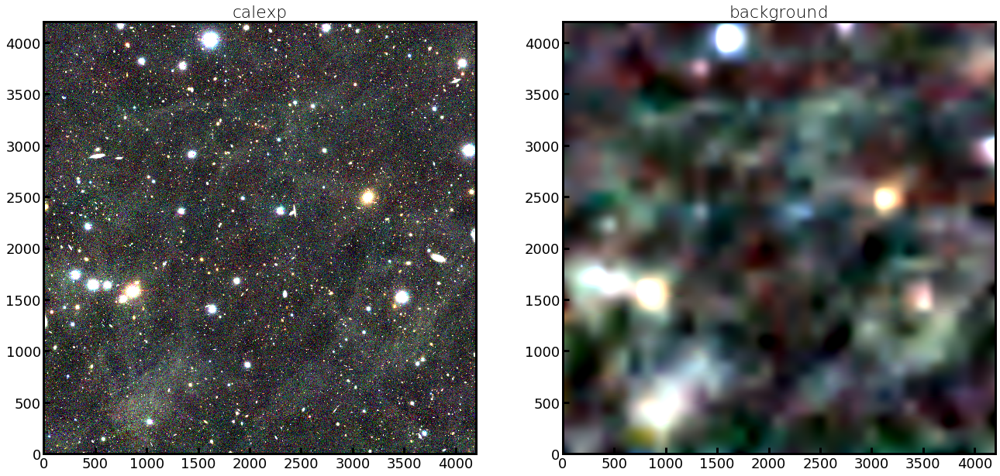

In [17]:
norm_gri = ImageNormalize(img_gri, interval=ZScaleInterval(),
                          stretch=LinearStretch())
norm_bg_gri = ImageNormalize(bg_img_gri, interval=ZScaleInterval(),
                             stretch=LinearStretch())

plt.rcParams.update({'figure.figsize' : (22, 12)})
plt.rcParams.update({'font.size' : 18})

f, ax = plt.subplots(1, 2)
axs = ax.flatten()

im0 = axs[0].imshow(img_gri, norm=norm_gri, origin='lower')
axs[0].set_title('calexp')
im1 = axs[1].imshow(bg_img_gri, norm=norm_bg_gri, origin='lower')
axs[1].set_title('background')
plt.show()

### Now try mosaicking multiple patches together
Remember to cut off the 100-pixel overlaps!

In [18]:
# Start near patch 2,3, which has lots of cirrus:
df_tract9697_patch23 = df_tract_patch_visit.loc[(df_tract_patch_visit['tract'] == 9697) & (df_tract_patch_visit['patch'] == '2,3')]
df_tract9697_patch24 = df_tract_patch_visit.loc[(df_tract_patch_visit['tract'] == 9697) & (df_tract_patch_visit['patch'] == '2,4')]
df_tract9697_patch33 = df_tract_patch_visit.loc[(df_tract_patch_visit['tract'] == 9697) & (df_tract_patch_visit['patch'] == '3,3')]
df_tract9697_patch34 = df_tract_patch_visit.loc[(df_tract_patch_visit['tract'] == 9697) & (df_tract_patch_visit['patch'] == '3,4')]

In [19]:
### Select the tract/patch in g-band filter, then the same tract/patch in R, I:
df_g23 = df_tract9697_patch23[(df_tract9697_patch23['filt'] == 'HSC-G')]
df_r23 = df_tract9697_patch23[(df_tract9697_patch23['filt'] == 'HSC-R')]
df_i23 = df_tract9697_patch23[(df_tract9697_patch23['filt'] == 'HSC-I')]

df_g24 = df_tract9697_patch24[(df_tract9697_patch24['filt'] == 'HSC-G')]
df_r24 = df_tract9697_patch24[(df_tract9697_patch24['filt'] == 'HSC-R')]
df_i24 = df_tract9697_patch24[(df_tract9697_patch24['filt'] == 'HSC-I')]

df_g33 = df_tract9697_patch33[(df_tract9697_patch33['filt'] == 'HSC-G')]
df_r33 = df_tract9697_patch33[(df_tract9697_patch33['filt'] == 'HSC-R')]
df_i33 = df_tract9697_patch33[(df_tract9697_patch33['filt'] == 'HSC-I')]

df_g34 = df_tract9697_patch34[(df_tract9697_patch34['filt'] == 'HSC-G')]
df_r34 = df_tract9697_patch34[(df_tract9697_patch34['filt'] == 'HSC-R')]
df_i34 = df_tract9697_patch34[(df_tract9697_patch34['filt'] == 'HSC-I')]

In [20]:
# Create dataIds for each tract/patch/filter combination
dataref_g23 = {'tract':int(df_g23.tract.values[0]), 'patch':df_g23.patch.values[0], 'filter':df_g23.filt.values[0]}
dataref_r23 = {'tract':int(df_r23.tract.values[0]), 'patch':df_r23.patch.values[0], 'filter':df_r23.filt.values[0]}
dataref_i23 = {'tract':int(df_i23.tract.values[0]), 'patch':df_i23.patch.values[0], 'filter':df_i23.filt.values[0]}
dataref_g24 = {'tract':int(df_g24.tract.values[0]), 'patch':df_g24.patch.values[0], 'filter':df_g24.filt.values[0]}
dataref_r24 = {'tract':int(df_r24.tract.values[0]), 'patch':df_r24.patch.values[0], 'filter':df_r24.filt.values[0]}
dataref_i24 = {'tract':int(df_i24.tract.values[0]), 'patch':df_i24.patch.values[0], 'filter':df_i24.filt.values[0]}
dataref_g33 = {'tract':int(df_g33.tract.values[0]), 'patch':df_g33.patch.values[0], 'filter':df_g33.filt.values[0]}
dataref_r33 = {'tract':int(df_r33.tract.values[0]), 'patch':df_r33.patch.values[0], 'filter':df_r33.filt.values[0]}
dataref_i33 = {'tract':int(df_i33.tract.values[0]), 'patch':df_i33.patch.values[0], 'filter':df_i33.filt.values[0]}
dataref_g34 = {'tract':int(df_g34.tract.values[0]), 'patch':df_g34.patch.values[0], 'filter':df_g34.filt.values[0]}
dataref_r34 = {'tract':int(df_r34.tract.values[0]), 'patch':df_r34.patch.values[0], 'filter':df_r34.filt.values[0]}
dataref_i34 = {'tract':int(df_i34.tract.values[0]), 'patch':df_i34.patch.values[0], 'filter':df_i34.filt.values[0]}

In [21]:
# Extract the images 
# (note that we're extracting only the image arrays, as the full Exposures are too big to keep in memory on the LSP)
img_g23 = butler.get('deepCoadd', dataId = dataref_g23).getImage().array
img_g24 = butler.get('deepCoadd', dataId = dataref_g24).getImage().array
img_g33 = butler.get('deepCoadd', dataId = dataref_g33).getImage().array
img_g34 = butler.get('deepCoadd', dataId = dataref_g34).getImage().array
bg_img_g23 = butler.get('deepCoadd_calexp_background', dataId = dataref_g23).getImage().array
bg_img_g24 = butler.get('deepCoadd_calexp_background', dataId = dataref_g24).getImage().array
bg_img_g33 = butler.get('deepCoadd_calexp_background', dataId = dataref_g33).getImage().array
bg_img_g34 = butler.get('deepCoadd_calexp_background', dataId = dataref_g34).getImage().array
img_r23 = butler.get('deepCoadd', dataId = dataref_r23).getImage().array
img_r24 = butler.get('deepCoadd', dataId = dataref_r24).getImage().array
img_r33 = butler.get('deepCoadd', dataId = dataref_r33).getImage().array
img_r34 = butler.get('deepCoadd', dataId = dataref_r34).getImage().array
bg_img_r23 = butler.get('deepCoadd_calexp_background', dataId = dataref_r23).getImage().array
bg_img_r24 = butler.get('deepCoadd_calexp_background', dataId = dataref_r24).getImage().array
bg_img_r33 = butler.get('deepCoadd_calexp_background', dataId = dataref_r33).getImage().array
bg_img_r34 = butler.get('deepCoadd_calexp_background', dataId = dataref_r34).getImage().array
img_i23 = butler.get('deepCoadd', dataId = dataref_i23).getImage().array
img_i24 = butler.get('deepCoadd', dataId = dataref_i24).getImage().array
img_i33 = butler.get('deepCoadd', dataId = dataref_i33).getImage().array
img_i34 = butler.get('deepCoadd', dataId = dataref_i34).getImage().array
bg_img_i23 = butler.get('deepCoadd_calexp_background', dataId = dataref_i23).getImage().array
bg_img_i24 = butler.get('deepCoadd_calexp_background', dataId = dataref_i24).getImage().array
bg_img_i33 = butler.get('deepCoadd_calexp_background', dataId = dataref_i33).getImage().array
bg_img_i34 = butler.get('deepCoadd_calexp_background', dataId = dataref_i34).getImage().array

In [22]:
def rebin( a, newshape ):
        '''Rebin an array to a new shape.
        '''
        assert len(a.shape) == len(newshape)

        slices = [ slice(0,old, float(old)/new) for old,new in zip(a.shape,newshape) ]
        coordinates = mgrid[slices]
        indices = coordinates.astype('i')   #choose the biggest smaller integer index
        return a[tuple(indices)]

In [29]:
def trim_rebin_img(inp_img, pos=None, smth=None, rebin_scale=2):
    # "pos" is (ul, ur, ll, lr) for Upper/Lower Left/Right
    # "smth" is the Gaussian smoothing scale to apply. If not set, no smoothing will be done.
    # "rebin_scale" is the factor to down-sample the image
    if pos == 'ul':
        img_trim = inp_img[100:,:-100]
    elif pos == 'ur':
        img_trim = inp_img[100:,100:]
    elif pos == 'll':
        img_trim = inp_img[:-100,:-100]
    elif pos == 'lr':
        img_trim = inp_img[:-100,100:]
    else:
        img_trim = inp_img
        print('Image not trimmed because no valid position specified.')
        
    if smth:
        img_trim = gaussian(img_trim, sigma=smth)
        
    img_trim_rebin = rebin(img_trim, (np.shape(img_trim)[0]/rebin_scale, np.shape(img_trim)[1]/rebin_scale))
    return img_trim_rebin

In [37]:
smth_scale = 5 # Gaussian smoothing scale

# g-band
bg_img_g23_trim_rebin = trim_rebin_img(bg_img_g23, pos='ll')
bg_img_g24_trim_rebin = trim_rebin_img(bg_img_g24, pos='ul')
bg_img_g33_trim_rebin = trim_rebin_img(bg_img_g33, pos='lr')
bg_img_g34_trim_rebin = trim_rebin_img(bg_img_g34, pos='ur')
img_g23_trim_rebin = trim_rebin_img(img_g23, pos='ll', smth=smth_scale)
img_g24_trim_rebin = trim_rebin_img(img_g24, pos='ul', smth=smth_scale)
img_g33_trim_rebin = trim_rebin_img(img_g33, pos='lr', smth=smth_scale)
img_g34_trim_rebin = trim_rebin_img(img_g34, pos='ur', smth=smth_scale)

# r-band
bg_img_r23_trim_rebin = trim_rebin_img(bg_img_r23, pos='ll')
bg_img_r24_trim_rebin = trim_rebin_img(bg_img_r24, pos='ul')
bg_img_r33_trim_rebin = trim_rebin_img(bg_img_r33, pos='lr')
bg_img_r34_trim_rebin = trim_rebin_img(bg_img_r34, pos='ur')
img_r23_trim_rebin = trim_rebin_img(img_r23, pos='ll', smth=smth_scale)
img_r24_trim_rebin = trim_rebin_img(img_r24, pos='ul', smth=smth_scale)
img_r33_trim_rebin = trim_rebin_img(img_r33, pos='lr', smth=smth_scale)
img_r34_trim_rebin = trim_rebin_img(img_r34, pos='ur', smth=smth_scale)

# i-band
bg_img_i23_trim_rebin = trim_rebin_img(bg_img_i23, pos='ll')
bg_img_i24_trim_rebin = trim_rebin_img(bg_img_i24, pos='ul')
bg_img_i33_trim_rebin = trim_rebin_img(bg_img_i33, pos='lr')
bg_img_i34_trim_rebin = trim_rebin_img(bg_img_i34, pos='ur')
img_i23_trim_rebin = trim_rebin_img(img_i23, pos='ll', smth=smth_scale)
img_i24_trim_rebin = trim_rebin_img(img_i24, pos='ul', smth=smth_scale)
img_i33_trim_rebin = trim_rebin_img(img_i33, pos='lr', smth=smth_scale)
img_i34_trim_rebin = trim_rebin_img(img_i34, pos='ur', smth=smth_scale)

In [38]:
# RGB image of the background:
bg_img_gri23 = rgb_img(bg_img_g23_trim_rebin, bg_img_r23_trim_rebin, bg_img_i23_trim_rebin)
bg_img_gri24 = rgb_img(bg_img_g24_trim_rebin, bg_img_r24_trim_rebin, bg_img_i24_trim_rebin)
bg_img_gri33 = rgb_img(bg_img_g33_trim_rebin, bg_img_r33_trim_rebin, bg_img_i33_trim_rebin)
bg_img_gri34 = rgb_img(bg_img_g34_trim_rebin, bg_img_r34_trim_rebin, bg_img_i34_trim_rebin)

# RGB image of the coaddd:
img_gri23 = rgb_img(img_g23_trim_rebin, img_r23_trim_rebin, img_i23_trim_rebin)
img_gri24 = rgb_img(img_g24_trim_rebin, img_r24_trim_rebin, img_i24_trim_rebin)
img_gri33 = rgb_img(img_g33_trim_rebin, img_r33_trim_rebin, img_i33_trim_rebin)
img_gri34 = rgb_img(img_g34_trim_rebin, img_r34_trim_rebin, img_i34_trim_rebin)

In [25]:
# Function to show images of 4 patches together:
def show4patches(ul_img, ur_img, ll_img, lr_img, outfile=None):
    plt.rcParams.update({'figure.figsize' : (19.5, 20)})
    fig=plt.figure()
    fig.subplots_adjust(wspace=0, hspace=0)

    ax1 = plt.subplot(221)
    ax1.axis('off')
    im1 = ax1.imshow(ul_img, origin='lower')
    ax2 = plt.subplot(222, sharey=ax1)
    ax2.axis('off')
    im2 = ax2.imshow(ur_img, origin='lower')
    ax3 = plt.subplot(223, sharex=ax1)
    ax3.axis('off')
    im3 = ax3.imshow(ll_img, origin='lower')
    ax4 = plt.subplot(224, sharex=ax2, sharey=ax3)
    ax4.axis('off')
    im4 = ax4.imshow(lr_img, origin='lower')
    
    if outfile:
        plt.savefig(outfile)

    plt.show()

### Background image:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


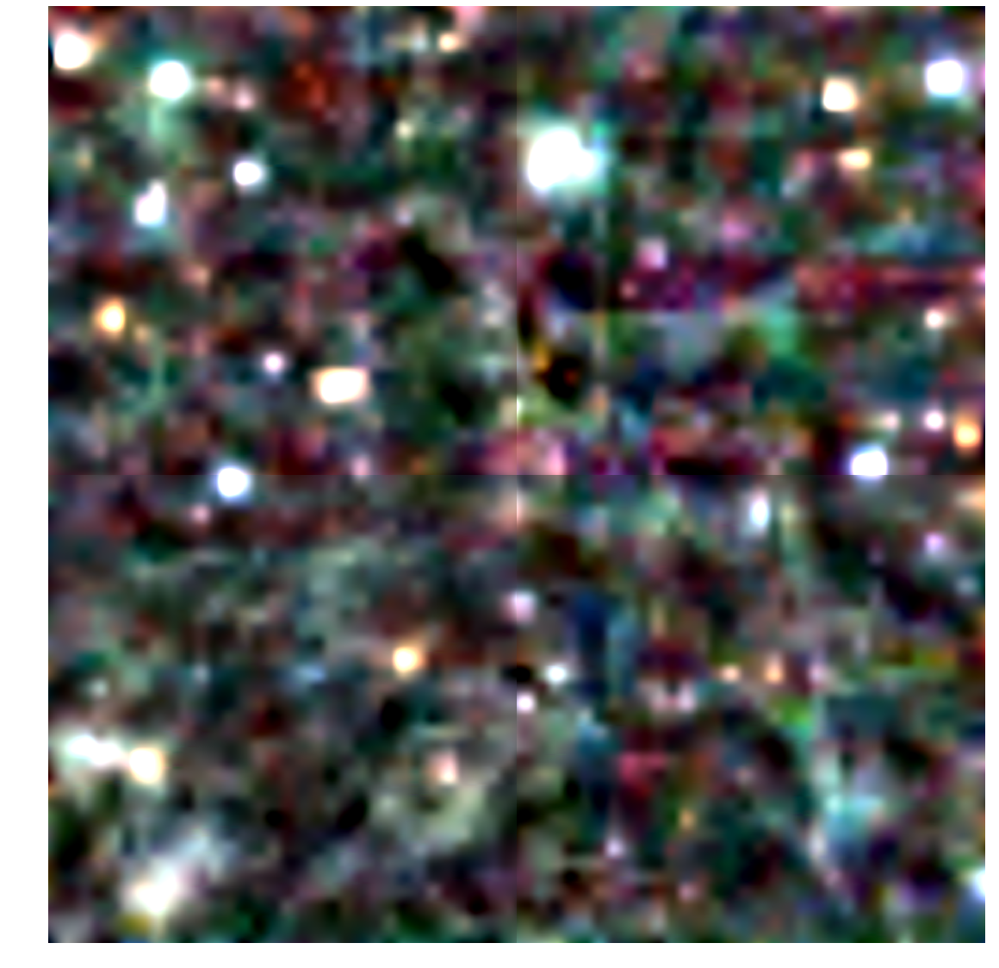

In [39]:
show4patches(bg_img_gri24, bg_img_gri34, bg_img_gri23, bg_img_gri33, outfile='DM-23121_bg_patches23_24_33_34.png')

### Deep coadd image:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


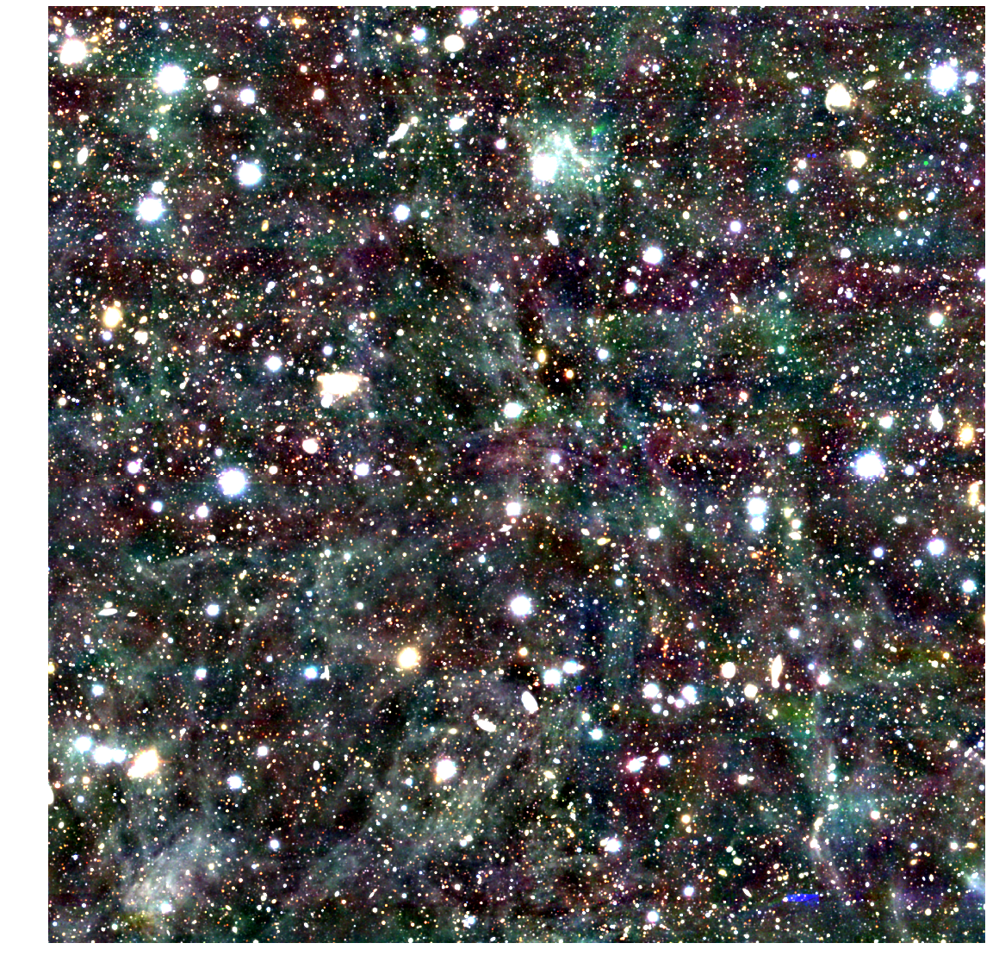

In [40]:
show4patches(img_gri24, img_gri34, img_gri23, img_gri33, outfile='DM-23121_coadd_patches23_24_33_34.png')

### We re-ran the background modeling at different scales. 
These are (at present) located in `/project/jcarlin/background_experiment/` on lsst-dev.

The "default" was 128x128 (in DM-23121 run). We also ran background scales of 256, 512, and 64, as well as one with a 128-pixel scale, but Chebyshev interpolation instead of a spline.

In [45]:
# Make a list of the repos:
repo_paths = ['/project/jcarlin/background_experiment/bg256',
              '/project/jcarlin/background_experiment/bg512',
              '/project/jcarlin/background_experiment/bg64',
              '/project/jcarlin/background_experiment/bg128_cheb']

Note: we can use the same datarefs as before, since we only included tract/patch/filter.

*Beware - the following cell takes a long time to run!*

/home/jcarlin/DM_sprint_Feb2020/img_scale.py:149: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  slope, intercept = numpy.linalg.lstsq(temp, y)[0]
/home/jcarlin/DM_sprint_Feb2020/img_scale.py:167: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  slope, intercept = numpy.linalg.lstsq(temp, y)[0]
/home/jcarlin/DM_sprint_Feb2020/img_scale.py:190: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and sile

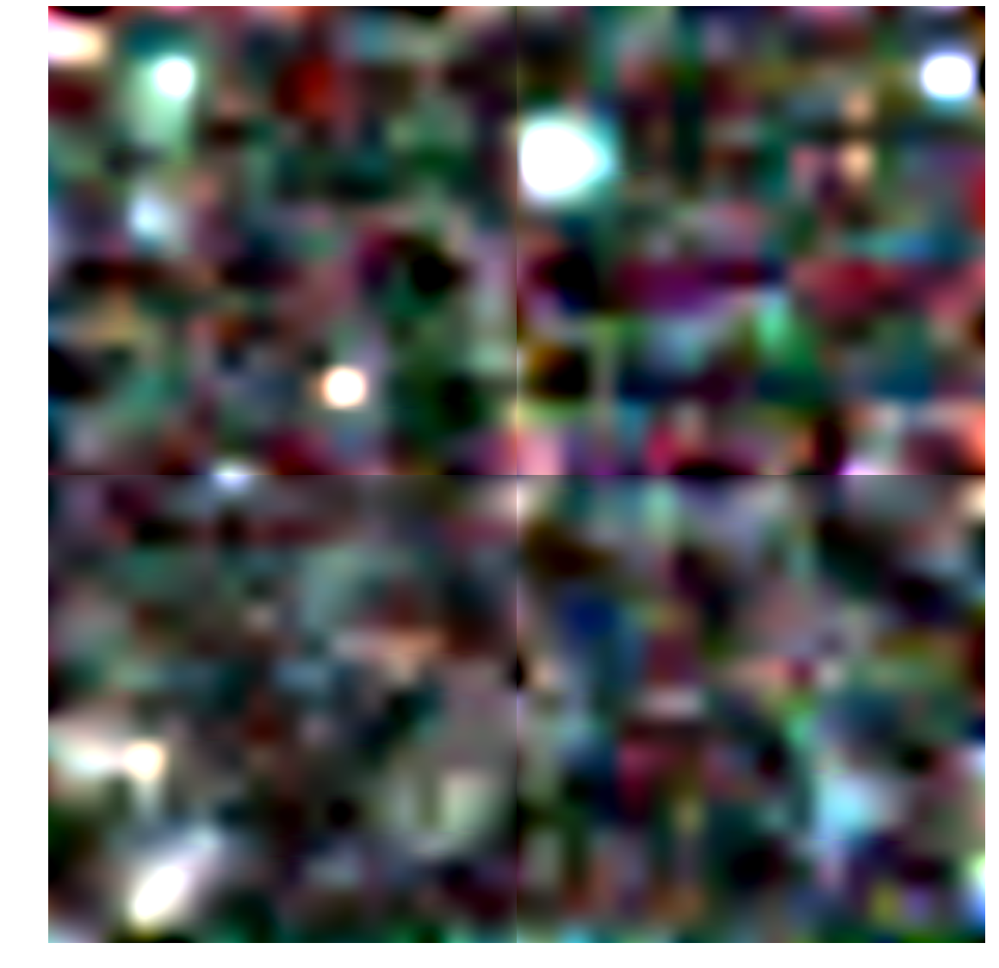

/home/jcarlin/DM_sprint_Feb2020/img_scale.py:149: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  slope, intercept = numpy.linalg.lstsq(temp, y)[0]
/home/jcarlin/DM_sprint_Feb2020/img_scale.py:167: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  slope, intercept = numpy.linalg.lstsq(temp, y)[0]
/home/jcarlin/DM_sprint_Feb2020/img_scale.py:190: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and sile

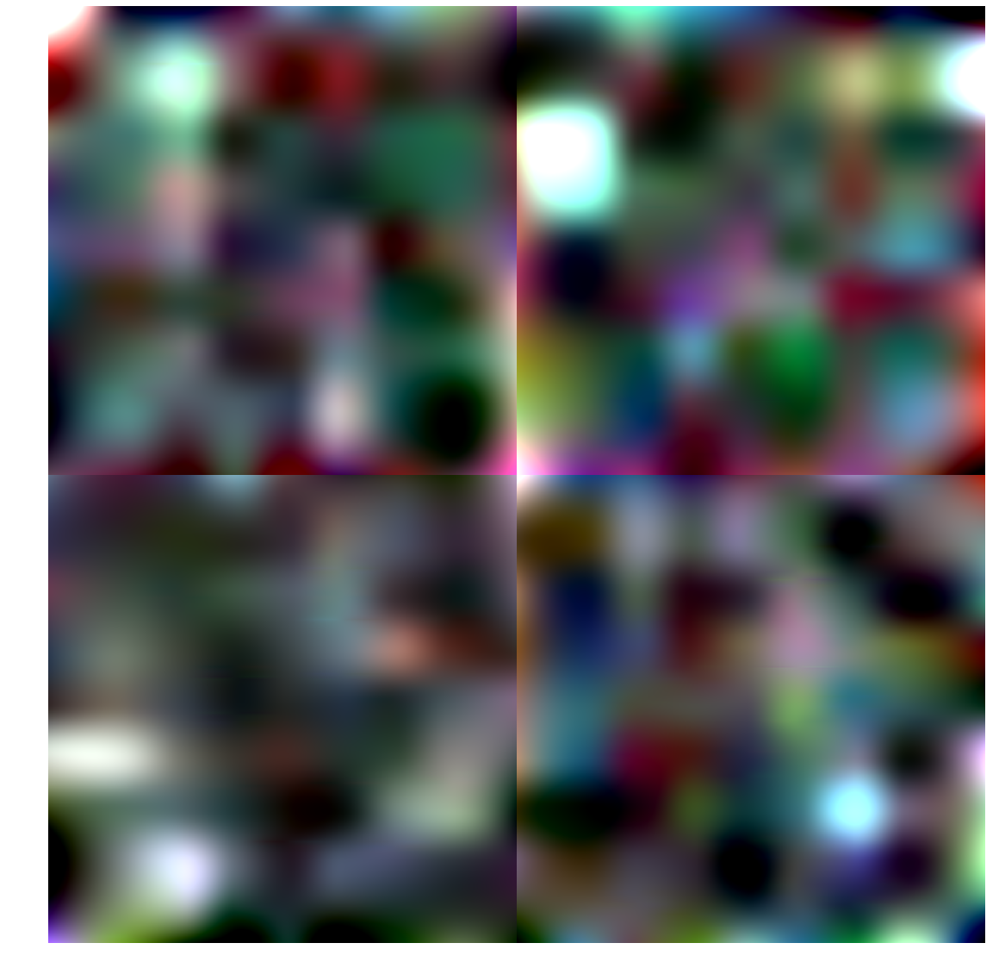

/home/jcarlin/DM_sprint_Feb2020/img_scale.py:149: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  slope, intercept = numpy.linalg.lstsq(temp, y)[0]
/home/jcarlin/DM_sprint_Feb2020/img_scale.py:167: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  slope, intercept = numpy.linalg.lstsq(temp, y)[0]
/home/jcarlin/DM_sprint_Feb2020/img_scale.py:190: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and sile

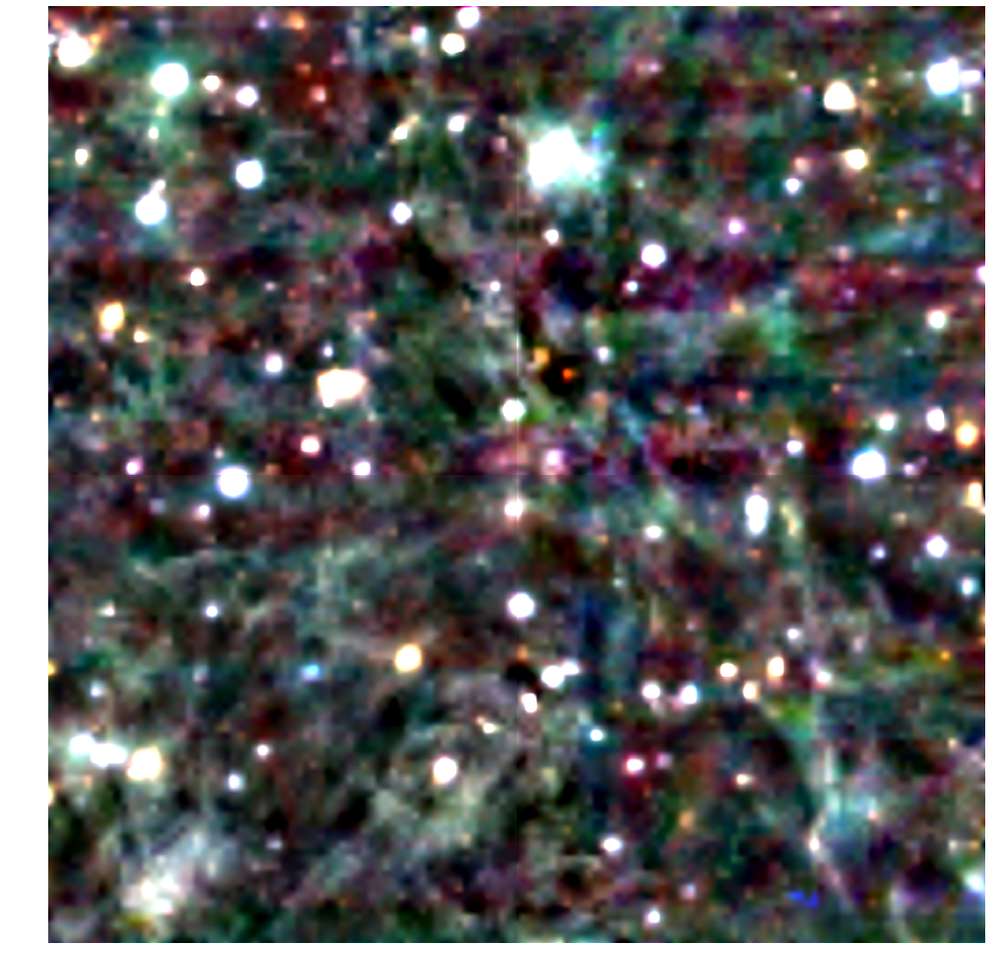

/home/jcarlin/DM_sprint_Feb2020/img_scale.py:149: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  slope, intercept = numpy.linalg.lstsq(temp, y)[0]
/home/jcarlin/DM_sprint_Feb2020/img_scale.py:167: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  slope, intercept = numpy.linalg.lstsq(temp, y)[0]
/home/jcarlin/DM_sprint_Feb2020/img_scale.py:190: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and sile

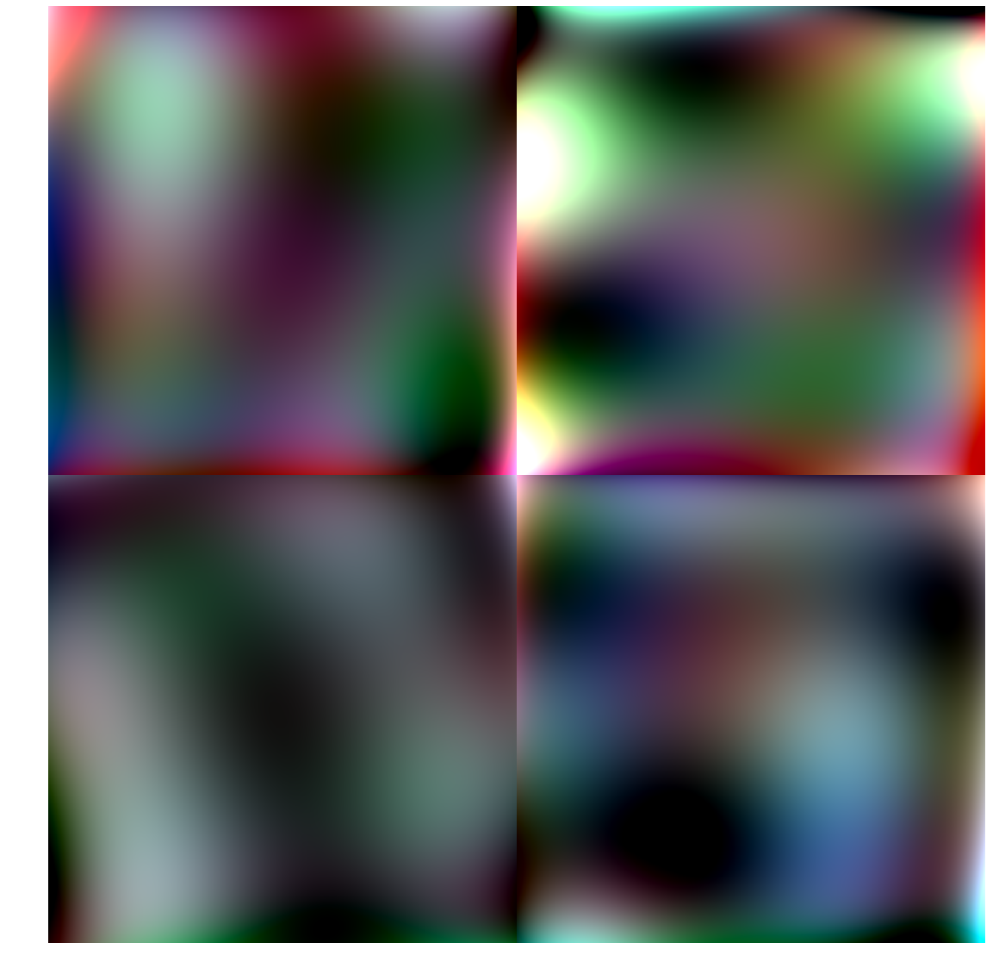

In [46]:
for repo in repo_paths:
    # Initialize the butler repo:
    butler = dafPersist.Butler(repo)

    img_g23 = butler.get('deepCoadd', dataId=dataref_g23).getImage().array
    img_g24 = butler.get('deepCoadd', dataId=dataref_g24).getImage().array
    img_g33 = butler.get('deepCoadd', dataId=dataref_g33).getImage().array
    img_g34 = butler.get('deepCoadd', dataId=dataref_g34).getImage().array
    bg_img_g23 = butler.get('deepCoadd_calexp_background', dataId=dataref_g23).getImage().array
    bg_img_g24 = butler.get('deepCoadd_calexp_background', dataId=dataref_g24).getImage().array
    bg_img_g33 = butler.get('deepCoadd_calexp_background', dataId=dataref_g33).getImage().array
    bg_img_g34 = butler.get('deepCoadd_calexp_background', dataId=dataref_g34).getImage().array
    img_r23 = butler.get('deepCoadd', dataId=dataref_r23).getImage().array
    img_r24 = butler.get('deepCoadd', dataId=dataref_r24).getImage().array
    img_r33 = butler.get('deepCoadd', dataId=dataref_r33).getImage().array
    img_r34 = butler.get('deepCoadd', dataId=dataref_r34).getImage().array
    bg_img_r23 = butler.get('deepCoadd_calexp_background', dataId=dataref_r23).getImage().array
    bg_img_r24 = butler.get('deepCoadd_calexp_background', dataId=dataref_r24).getImage().array
    bg_img_r33 = butler.get('deepCoadd_calexp_background', dataId=dataref_r33).getImage().array
    bg_img_r34 = butler.get('deepCoadd_calexp_background', dataId=dataref_r34).getImage().array
    img_i23 = butler.get('deepCoadd', dataId=dataref_i23).getImage().array
    img_i24 = butler.get('deepCoadd', dataId=dataref_i24).getImage().array
    img_i33 = butler.get('deepCoadd', dataId=dataref_i33).getImage().array
    img_i34 = butler.get('deepCoadd', dataId=dataref_i34).getImage().array
    bg_img_i23 = butler.get('deepCoadd_calexp_background', dataId=dataref_i23).getImage().array
    bg_img_i24 = butler.get('deepCoadd_calexp_background', dataId=dataref_i24).getImage().array
    bg_img_i33 = butler.get('deepCoadd_calexp_background', dataId=dataref_i33).getImage().array
    bg_img_i34 = butler.get('deepCoadd_calexp_background', dataId=dataref_i34).getImage().array

    # g-band
    bg_img_g23_trim_rebin = trim_rebin_img(bg_img_g23, pos='ll')
    bg_img_g24_trim_rebin = trim_rebin_img(bg_img_g24, pos='ul')
    bg_img_g33_trim_rebin = trim_rebin_img(bg_img_g33, pos='lr')
    bg_img_g34_trim_rebin = trim_rebin_img(bg_img_g34, pos='ur')
    img_g23_trim_rebin = trim_rebin_img(img_g23, pos='ll', smth=smth_scale)
    img_g24_trim_rebin = trim_rebin_img(img_g24, pos='ul', smth=smth_scale)
    img_g33_trim_rebin = trim_rebin_img(img_g33, pos='lr', smth=smth_scale)
    img_g34_trim_rebin = trim_rebin_img(img_g34, pos='ur', smth=smth_scale)

    # r-band
    bg_img_r23_trim_rebin = trim_rebin_img(bg_img_r23, pos='ll')
    bg_img_r24_trim_rebin = trim_rebin_img(bg_img_r24, pos='ul')
    bg_img_r33_trim_rebin = trim_rebin_img(bg_img_r33, pos='lr')
    bg_img_r34_trim_rebin = trim_rebin_img(bg_img_r34, pos='ur')
    img_r23_trim_rebin = trim_rebin_img(img_r23, pos='ll', smth=smth_scale)
    img_r24_trim_rebin = trim_rebin_img(img_r24, pos='ul', smth=smth_scale)
    img_r33_trim_rebin = trim_rebin_img(img_r33, pos='lr', smth=smth_scale)
    img_r34_trim_rebin = trim_rebin_img(img_r34, pos='ur', smth=smth_scale)

    # i-band
    bg_img_i23_trim_rebin = trim_rebin_img(bg_img_i23, pos='ll')
    bg_img_i24_trim_rebin = trim_rebin_img(bg_img_i24, pos='ul')
    bg_img_i33_trim_rebin = trim_rebin_img(bg_img_i33, pos='lr')
    bg_img_i34_trim_rebin = trim_rebin_img(bg_img_i34, pos='ur')
    img_i23_trim_rebin = trim_rebin_img(img_i23, pos='ll', smth=smth_scale)
    img_i24_trim_rebin = trim_rebin_img(img_i24, pos='ul', smth=smth_scale)
    img_i33_trim_rebin = trim_rebin_img(img_i33, pos='lr', smth=smth_scale)
    img_i34_trim_rebin = trim_rebin_img(img_i34, pos='ur', smth=smth_scale)
    
    # RGB image of the background:
    bg_img_gri23 = rgb_img(bg_img_g23_trim_rebin, bg_img_r23_trim_rebin, bg_img_i23_trim_rebin)
    bg_img_gri24 = rgb_img(bg_img_g24_trim_rebin, bg_img_r24_trim_rebin, bg_img_i24_trim_rebin)
    bg_img_gri33 = rgb_img(bg_img_g33_trim_rebin, bg_img_r33_trim_rebin, bg_img_i33_trim_rebin)
    bg_img_gri34 = rgb_img(bg_img_g34_trim_rebin, bg_img_r34_trim_rebin, bg_img_i34_trim_rebin)

    # RGB image of the coaddd:
    img_gri23 = rgb_img(img_g23_trim_rebin, img_r23_trim_rebin, img_i23_trim_rebin)
    img_gri24 = rgb_img(img_g24_trim_rebin, img_r24_trim_rebin, img_i24_trim_rebin)
    img_gri33 = rgb_img(img_g33_trim_rebin, img_r33_trim_rebin, img_i33_trim_rebin)
    img_gri34 = rgb_img(img_g34_trim_rebin, img_r34_trim_rebin, img_i34_trim_rebin)
    
    bgname = repo.split('/')[-1]

    show4patches(bg_img_gri24, bg_img_gri34, bg_img_gri23, bg_img_gri33, outfile=bgname+'_bg_patches23_24_33_34.png')